![](img/fff.PNG)



<a id='section0'></a>


# Complete Project on Advacne Machine learning for Big Data 


#### By <a href="http://turkialjrees.com">Turki Aljrees </a> 

_18/08/2019_

---

# Mini Project Tasks

> # Table of Content 

<a id='hyperlink'></a>

**Table of Content:**<br>

   - [Data Insight ](#0) 
   - [Data Cleaning ](#1) 
   - [Data Exploration ](#2) 
   - [Data Integration ](#3)  
   - [Feature Transformation (Feature Engineering)](#4)   
   - [Feature Selction and model building ](#6)   
   - [Data Test / Training](#7)  
   - [Advanced subspace Clustering](#8)  



Remember thses are also ideas of what each task, how can be achived ,  comment on each task, which I already have done some of it. it mixed of defention and ideas 


<a id='0'></a>

## Data Insight
this is an Insight section about the data before any changes

### Introduce the Data

 **Note:**

some Data Exploartion and cleaning in python, 
***Our data is unlabled data set at the moments***


In [1]:
### Import the required libraries
import json
import csv
import time
import calendar
import sklearn
from sklearn.svm import SVC
import numpy as np
import pandas as pd
import datetime as datetime
from collections import defaultdict

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style('whitegrid')

import os
os.chdir("C://Users/SHIVAM/Desktop/turkialjeres/")

**NOTE**


in the read_csv() function below, please see nrows = 10000, that means I am only reading 10000 rows to save time and run the model, as with more data, more time will be required to train the clustering algorithm. Please chaange it back or remove this part (all data) as per your own choice.

In [2]:
data = pd.read_csv("Crime_comma.csv",error_bad_lines=False, nrows=10000)
data.head()

print('Dataset ready..')
print('Dataset Shape before drop_duplicate : ', data.shape)
print('Dataset Shape after drop_duplicate: ', data.shape)

print("All columns present in the dataset : ")
list(data.columns)

Dataset ready..
Dataset Shape before drop_duplicate :  (10000, 19)
Dataset Shape after drop_duplicate:  (10000, 19)
All columns present in the dataset : 


b'Skipping line 7851: expected 19 fields, saw 20\n'


['Crime_Ref',
 'Crime_Num',
 'Date_First_Committed',
 'Time_First_Committed',
 'Day_First_Committed',
 'Date_Last_Committed',
 'Time_Last_Committed',
 'Day_Last_Committed',
 'Street',
 'District',
 'Town',
 'Post_Code',
 'Offence',
 'MO_Desc',
 'Beat_Num',
 'HOMC_Code',
 'HOOC_Code',
 'Northing',
 'Easting']

In [3]:
data['Offence'].value_counts()

THEFT FROM MOTOR VEHICLE                            1216
BURGLARY DWELLING                                    971
BURGLARY OTHER BUILDING                              768
CRIMINAL DAMAGE TO VEHICLE                           726
TAKE MOTOR/VEH W/O OWNER CONSENT                     631
CRIMINAL DAMAGE TO DWELLING                          569
THEFT OTHER                                          502
THEFT FROM SHOP OR STALL                             484
COMMON ASSAULT                                       413
MAKE OFF W/O PAYMENT                                 300
ASSAULT OCCASION ABH                                 290
THEFT OF MOTOR VEHICLE                               287
CRIMINAL DAMAGE TO OTHER BUILDING                    273
ROBBERY-PERSONAL PROPERTY                            268
THEFT FROM PERSON                                    218
ATTEMPT BURGLARY DWELLING                            160
INTERFERE WITH VEHICLE                               141
THEFT OF P/CYCLE               

In [4]:
data.head()

,Crime_Ref,Crime_Num,Date_First_Committed,Time_First_Committed,Day_First_Committed,Date_Last_Committed,Time_Last_Committed,Day_Last_Committed,Street,District,Town,Post_Code,Offence,MO_Desc,Beat_Num,HOMC_Code,HOOC_Code,Northing,Easting
0,81690360,99Y4/463197/19,18-Mar-17 12:00:00 AM,30-Oct-15 09:40:00 PM,SAT,18-Mar-17,30-Oct-15 09:55:00 PM,SAT,BUNTINGS LANE,LORDS ORCHARD,CARSINGTON,B38 8AP,TAKE MOTOR/VEH W/O OWNER CONSENT,NaN,E426,48.0,2.0,279100,403600
1,122679527,99Y3/274/17,01-Jan-17 12:00:00 AM,30-Oct-15 12:40:00 AM,SUN,-,NaN,NaN,ADMINGTON,CRAMINGTON,CARSINGTON,B32 3HS,CRIMINAL DAMAGE TO DWELLING,NaN,E320,58.0,3.0,282400,400600
2,122679664,99Y5/274/17,01-Jan-17 12:00:00 AM,30-Oct-15 12:14:00 AM,SUN,01-Jan-17,30-Oct-15 12:15:00 AM,SUN,COKERS LANE,NAYBAIRN,CARSINGTON,B13 9DX,CRIMINAL DAMAGE TO DWELLING,NaN,E536,58.0,3.0,283400,408200
3,122679801,99K5/548/17,01-Jan-17 12:00:00 AM,30-Oct-15 12:20:00 AM,SUN,-,NaN,NaN,OCEAN CLOSE,ISTREAY BROOK,DEWMAPLE,NaN,CAUSE DANGER-ITEM TO BE ON ROAD,NaN,M541,5.0,11.0,282100,433600
4,122680623,99F4/274/17,01-Jan-17 12:00:00 AM,30-Oct-15 12:25:00 AM,SUN,01-Jan-17,30-Oct-15 12:32:00 AM,SUN,HERBERT CRESCENT,CHARLMERE,YARNFORTH,WS2 0LU,COMMON ASSAULT,NaN,H457,105.0,1.0,299600,398700


We will drop these variables as they dont have much significance in the model learning, or they will create model overfitting

In [5]:
data.drop(['Crime_Ref', 'Crime_Num', 'Date_First_Committed', 'Time_First_Committed', 'Date_Last_Committed', 'Time_Last_Committed'], inplace=True, axis=1)

In [6]:
data.head(3)

,Day_First_Committed,Day_Last_Committed,Street,District,Town,Post_Code,Offence,MO_Desc,Beat_Num,HOMC_Code,HOOC_Code,Northing,Easting
0,SAT,SAT,BUNTINGS LANE,LORDS ORCHARD,CARSINGTON,B38 8AP,TAKE MOTOR/VEH W/O OWNER CONSENT,NaN,E426,48.0,2.0,279100,403600
1,SUN,NaN,ADMINGTON,CRAMINGTON,CARSINGTON,B32 3HS,CRIMINAL DAMAGE TO DWELLING,NaN,E320,58.0,3.0,282400,400600
2,SUN,SUN,COKERS LANE,NAYBAIRN,CARSINGTON,B13 9DX,CRIMINAL DAMAGE TO DWELLING,NaN,E536,58.0,3.0,283400,408200


How many records we have and how many features for each record?



In [7]:
# of records X # of features
data.shape

(10000, 13)

In [8]:
print("All columns present in the dataset after removing a few above: ")
list(data.columns)

All columns present in the dataset after removing a few above: 


['Day_First_Committed',
 'Day_Last_Committed',
 'Street',
 'District',
 'Town',
 'Post_Code',
 'Offence',
 'MO_Desc',
 'Beat_Num',
 'HOMC_Code',
 'HOOC_Code',
 'Northing',
 'Easting']

In [9]:
# Let's make sure we are dealing with the right type of columns
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 13 columns):
Day_First_Committed    10000 non-null object
Day_Last_Committed     8626 non-null object
Street                 9976 non-null object
District               9074 non-null object
Town                   9952 non-null object
Post_Code              7618 non-null object
Offence                10000 non-null object
MO_Desc                1805 non-null object
Beat_Num               10000 non-null object
HOMC_Code              9419 non-null float64
HOOC_Code              9419 non-null float64
Northing               10000 non-null int64
Easting                10000 non-null int64
dtypes: float64(2), int64(2), object(9)
memory usage: 1015.7+ KB


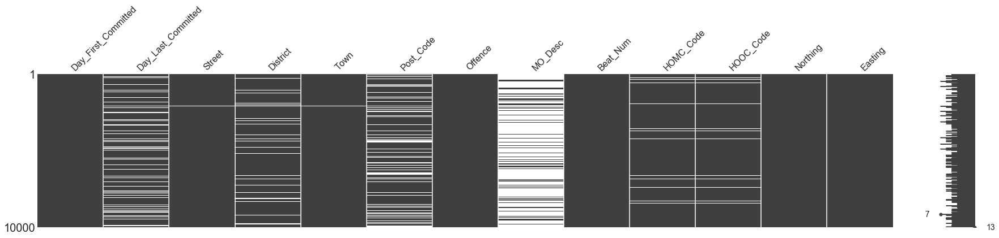

In [10]:
# How many missing values are there in our dataset?
import missingno
missingno.matrix(data, figsize = (30,5))

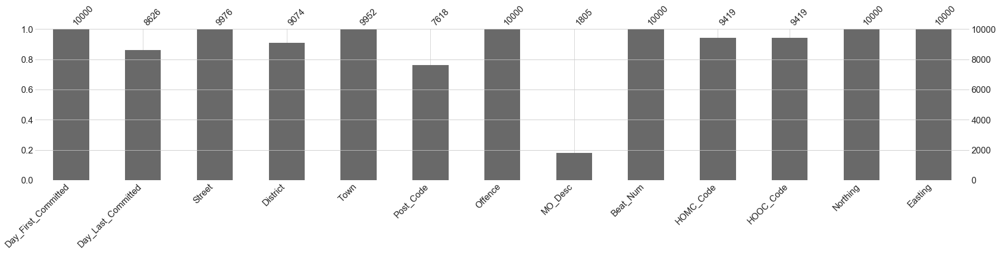

In [11]:
missingno.bar(data, sort='ascending', figsize = (30,5))

missing values exist.

---

<a id='1'></a>
## Data Cleaning
<br>[Main Menue](#hyperlink)


**Data cleanup and normalization**
<br>
There is significant work involved in translating ideas and raw data sets into actual model inputs.

Data may need to be transformed into a different scale in order to make it easier to work with or align with other data sets.

pre-processing the data to extract the relevant information is usually required.


**Cleaning and preparing data is a critical first step in any machine learning project. **



### A. Dealing with data types

- There are three main data types:
    - Numeric, e.g. income, age
    - Categorical, e.g. gender, nationality 
    - Ordinal, e.g. low/medium/high
    
- Must convert categorical and ordinal features into numeric features
    - Handling mising data Values (if there is)
    - Noisy Data smoothing
    - Create dummy features
    - Transform a categorical feature into a set of dummy features, each representing a unique category
    
    

#### Remove missing and Imputing  values

### Impute Missing Values

Imputing refers to using a model to replace missing values.

There are many options we could consider when replacing a missing value, for example:

1. A constant value that has meaning within the domain, such as 0, distinct from all other values.
2. A value from another randomly selected record.
3. A mean, median or mode value for the column.
4. A value estimated by another predictive model.

In [12]:
data.shape

(10000, 13)

### To impute with most occuring

In [13]:
data = data.apply(lambda x:x.fillna(x.value_counts().index[0]))

In [14]:
data.isnull().sum()

Day_First_Committed    0
Day_Last_Committed     0
Street                 0
District               0
Town                   0
Post_Code              0
Offence                0
MO_Desc                0
Beat_Num               0
HOMC_Code              0
HOOC_Code              0
Northing               0
Easting                0
dtype: int64

No missing values now!

### To drop

## Drop Duplicate records

In [15]:
data.drop_duplicates( keep='first', inplace=True)

### Data Processing

#### We will make dummies for these variables

In [16]:
print(data.Day_First_Committed.value_counts())
print(data.Day_Last_Committed.value_counts())

SUN    1773
TUE    1557
WED    1543
THU    1505
MON    1325
FRI     998
SAT     981
Name: Day_First_Committed, dtype: int64
WED    2726
TUE    1388
SUN    1340
THU    1282
MON    1156
FRI    1044
SAT     746
Name: Day_Last_Committed, dtype: int64


#### We will change these to numerical attributes 

In [17]:
print("Finding number of unique Data Points")
print()
print("District = ", len(data.District.unique()))
print("Town = ", len(data.Town.unique()))
print("Street = ", len(data.Street.unique()))
print("Post Code = ", len(data.Post_Code.unique()))
print("Offence = ", len(data.Offence.unique()))
print("MO_Desc = ", len(data.MO_Desc.unique()))
print("Beat_Num = ", len(data.Beat_Num.unique()))

Finding number of unique Data Points

District =  300
Town =  16
Street =  4365
Post Code =  5564
Offence =  162
MO_Desc =  1407
Beat_Num =  682


In [18]:
# An utility function to create dummy variable
def create_dummies( df, colname ):
    col_dummies = pd.get_dummies(df[colname], prefix=colname)
    col_dummies.drop(col_dummies.columns[0], axis=1, inplace=True)
    df = pd.concat([df, col_dummies], axis=1)
    df.drop( colname, axis = 1, inplace = True )
    return df

In [19]:
df = create_dummies(data, 'Day_First_Committed')
df = create_dummies(df, 'Day_Last_Committed')
df = create_dummies(df, 'Town')
df = create_dummies(df, 'Offence')
df.head()

,Street,District,Post_Code,MO_Desc,Beat_Num,HOMC_Code,HOOC_Code,Northing,Easting,Day_First_Committed_MON,...,Offence_THREAT/ABUSE/INSULT WORDS DISTRESS (S.5),Offence_THREAT/ABUSE/INSULT WORDS RACIAL HATRED,Offence_THREAT/ABUSE/INSULT WORDS/BEHAV,Offence_THREATEN TO DAMAGE PROPERTY,Offence_THREATEN WITNESS / JUROR,Offence_THREATS TO KILL,Offence_USE TEST CERTIFICATE W/I TO DECEIVE,Offence_VIOLENT DISORDER,Offence_WOUND WITH INTENT TO COMMIT GBH,Offence_WOUNDING
0,BUNTINGS LANE,LORDS ORCHARD,B38 8AP,BURGLARY ENTRY:NOT KNOWN:NOT KNOWN:NOT KNOWN:N...,E426,48.0,2.0,279100,403600,0,...,0,0,0,0,0,0,0,0,0,0
1,ADMINGTON,CRAMINGTON,B32 3HS,BURGLARY ENTRY:NOT KNOWN:NOT KNOWN:NOT KNOWN:N...,E320,58.0,3.0,282400,400600,0,...,0,0,0,0,0,0,0,0,0,0
2,COKERS LANE,NAYBAIRN,B13 9DX,BURGLARY ENTRY:NOT KNOWN:NOT KNOWN:NOT KNOWN:N...,E536,58.0,3.0,283400,408200,0,...,0,0,0,0,0,0,0,0,0,0
3,OCEAN CLOSE,ISTREAY BROOK,DY5 1SY,BURGLARY ENTRY:NOT KNOWN:NOT KNOWN:NOT KNOWN:N...,M541,5.0,11.0,282100,433600,0,...,0,0,0,0,0,0,0,0,0,0
4,HERBERT CRESCENT,CHARLMERE,WS2 0LU,BURGLARY ENTRY:NOT KNOWN:NOT KNOWN:NOT KNOWN:N...,H457,105.0,1.0,299600,398700,0,...,0,0,0,0,0,0,0,0,0,0


#### We will drop the factors which have over 1000 uique labels, which can cause overfitting or model not learning data problem.

Model will not be able to understand the data well otherwise and it will overfit.

In [20]:
df.drop(['Street', 'Post_Code', 'MO_Desc'], axis=1, inplace=True)
df.head()

,District,Beat_Num,HOMC_Code,HOOC_Code,Northing,Easting,Day_First_Committed_MON,Day_First_Committed_SAT,Day_First_Committed_SUN,Day_First_Committed_THU,...,Offence_THREAT/ABUSE/INSULT WORDS DISTRESS (S.5),Offence_THREAT/ABUSE/INSULT WORDS RACIAL HATRED,Offence_THREAT/ABUSE/INSULT WORDS/BEHAV,Offence_THREATEN TO DAMAGE PROPERTY,Offence_THREATEN WITNESS / JUROR,Offence_THREATS TO KILL,Offence_USE TEST CERTIFICATE W/I TO DECEIVE,Offence_VIOLENT DISORDER,Offence_WOUND WITH INTENT TO COMMIT GBH,Offence_WOUNDING
0,LORDS ORCHARD,E426,48.0,2.0,279100,403600,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,CRAMINGTON,E320,58.0,3.0,282400,400600,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,NAYBAIRN,E536,58.0,3.0,283400,408200,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,ISTREAY BROOK,M541,5.0,11.0,282100,433600,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,CHARLMERE,H457,105.0,1.0,299600,398700,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [21]:
df["District"] = df["District"].astype('category')
df["District_Coded"] = df["District"].cat.codes
df["Beat_Num"] = df["Beat_Num"].astype('category')
df["Beat_Num_Coded"] = df["Beat_Num"].cat.codes
df.drop(['District', 'Beat_Num'],axis=1, inplace=True)
df.head()

,HOMC_Code,HOOC_Code,Northing,Easting,Day_First_Committed_MON,Day_First_Committed_SAT,Day_First_Committed_SUN,Day_First_Committed_THU,Day_First_Committed_TUE,Day_First_Committed_WED,...,Offence_THREAT/ABUSE/INSULT WORDS/BEHAV,Offence_THREATEN TO DAMAGE PROPERTY,Offence_THREATEN WITNESS / JUROR,Offence_THREATS TO KILL,Offence_USE TEST CERTIFICATE W/I TO DECEIVE,Offence_VIOLENT DISORDER,Offence_WOUND WITH INTENT TO COMMIT GBH,Offence_WOUNDING,District_Coded,Beat_Num_Coded
0,48.0,2.0,279100,403600,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,146,176
1,58.0,3.0,282400,400600,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,49,135
2,58.0,3.0,283400,408200,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,170,194
3,5.0,11.0,282100,433600,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,130,662
4,105.0,1.0,299600,398700,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,35,404


In [22]:
df.drop(['Northing', 'Easting'],axis=1, inplace=True)

In [23]:
df.head()

,HOMC_Code,HOOC_Code,Day_First_Committed_MON,Day_First_Committed_SAT,Day_First_Committed_SUN,Day_First_Committed_THU,Day_First_Committed_TUE,Day_First_Committed_WED,Day_Last_Committed_MON,Day_Last_Committed_SAT,...,Offence_THREAT/ABUSE/INSULT WORDS/BEHAV,Offence_THREATEN TO DAMAGE PROPERTY,Offence_THREATEN WITNESS / JUROR,Offence_THREATS TO KILL,Offence_USE TEST CERTIFICATE W/I TO DECEIVE,Offence_VIOLENT DISORDER,Offence_WOUND WITH INTENT TO COMMIT GBH,Offence_WOUNDING,District_Coded,Beat_Num_Coded
0,48.0,2.0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,146,176
1,58.0,3.0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,49,135
2,58.0,3.0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,170,194
3,5.0,11.0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,130,662
4,105.0,1.0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,35,404


### Outlier and Noise Treatment

#### What is an Outlier?

Outlier is a commonly used terminology by analysts and data scientists as it needs close attention else it can result in wildly wrong estimations. Simply speaking, Outlier is an observation that appears far away and diverges from an overall pattern in a sample.

<img src = "http://r-statistics.co/screenshots/outliers_effect.png"/>

#### What are the types of Outliers?

Outlier can be of two types: Univariate and Multivariate. Above, we have discussed the example of univariate outlier. These outliers can be found when we look at distribution of a single variable. Multi-variate outliers are outliers in an n-dimensional space. In order to find them, you have to look at distributions in multi-dimensions.


#### What is the impact of Outliers on a dataset?

Outliers can drastically change the results of the data analysis and statistical modeling. There are numerous unfavourable impacts of outliers in the data set:

It increases the error variance and reduces the power of statistical tests
If the outliers are non-randomly distributed, they can decrease normality
They can bias or influence estimates that may be of substantive interest
They can also impact the basic assumption of Regression, ANOVA and other statistical model assumptions.

#### How to detect Outliers?
Most commonly used method to detect outliers is visualization. We use various visualization methods, like Box-plot, Histogram, Scatter Plot (above, we have used box plot and scatter plot for visualization). Some analysts also various thumb rules to detect outliers. Some of them are:

1. Any value, which is beyond the range of -1.5 x IQR to 1.5 x IQR
2. Use capping methods. Any value which out of range of 5th and 95th percentile can be considered as outlier
3. Data points, three or more standard deviation away from mean are considered outlier
4. Outlier detection is merely a special case of the examination of data for influential data points and it also depends on the business understanding
5. Bivariate and multivariate outliers are typically measured using either an index of influence or leverage, or distance. Popular indices such as Mahalanobis’ distance and Cook’s D are frequently used to detect outliers.

If you have multiple columns in your dataframe and would like to remove all rows that have outliers in at least one column, the following expression would do that in one shot.

In [24]:
from scipy import stats
df = df[(np.abs(stats.zscore(df)) < 3).all(axis=1)]

In [25]:
df.shape

(658, 192)

#### Check missing values again

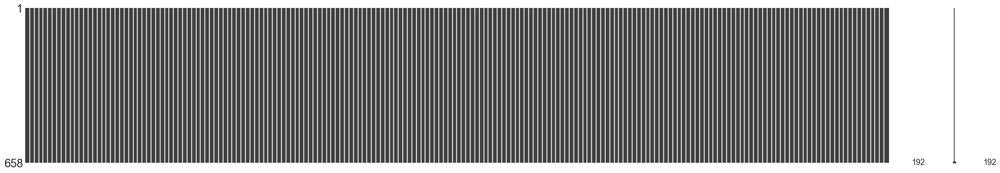

In [26]:
import missingno
missingno.matrix(df, figsize = (30,5))

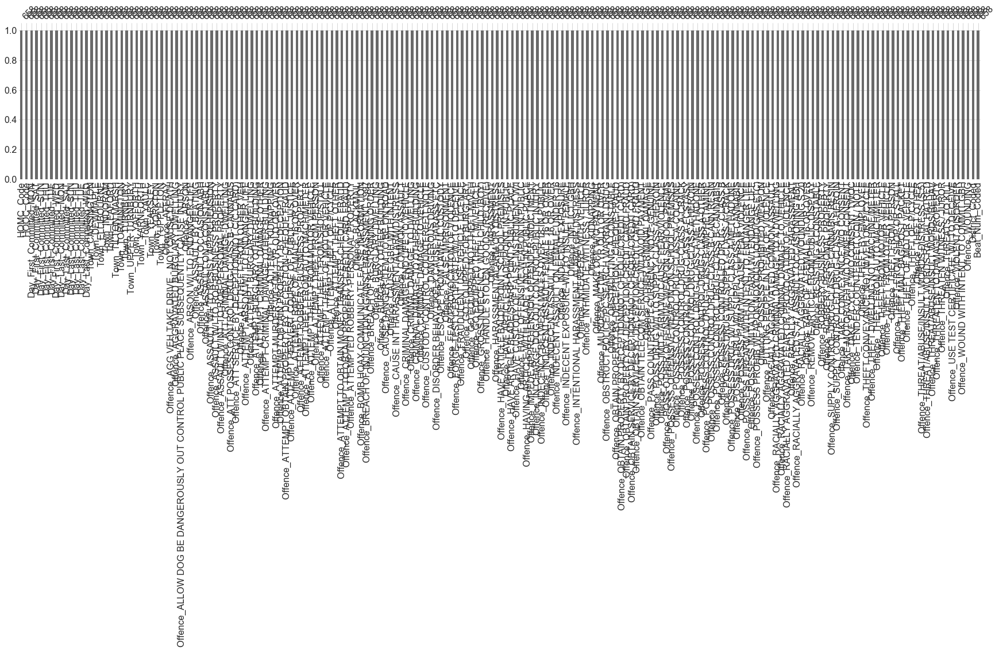

In [27]:
missingno.bar(df, sort='ascending', figsize = (30,5))

No missing values exist now.

---

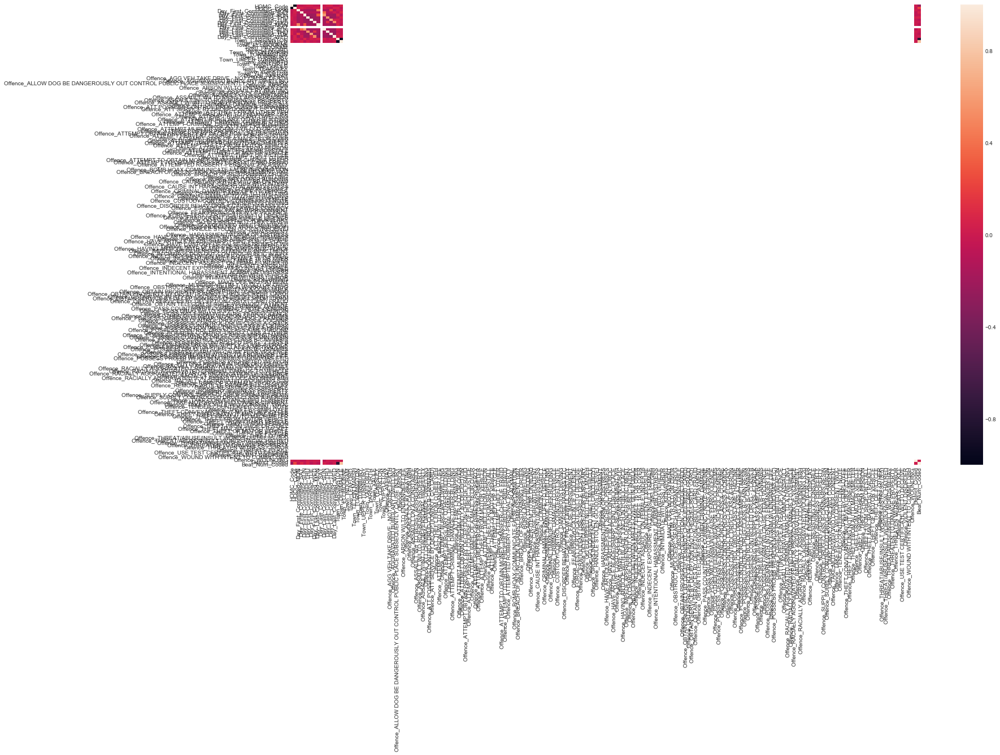

In [28]:
corr = df.corr()
plt.figure(figsize=(25,15))
sns.heatmap(corr, xticklabels=corr.columns.values,yticklabels=corr.columns.values)

In [29]:
cmap = cmap=sns.diverging_palette(10, 250, as_cmap=True)

def magnify():
    return [dict(selector="th",
                 props=[("font-size", "9pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '300px'),
                        ('font-size', '12pt')])
]

corr.style.background_gradient(cmap, axis=1)\
    .set_properties(**{'max-width': '80px', 'font-size': '10pt'})\
    .set_caption("Hover to magify")\
    .set_precision(2)\
    .set_table_styles(magnify())

C:\Users\SHIVAM\Anaconda3\lib\site-packages\matplotlib\colors.py:504: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


---

# Checking optimal number of Clusters

---

The **first step** in clustering analysis is to assess whether the dataset is clusterable. This has been described in a chapter entitled: Assessing Clustering Tendency.

Partitioning methods, such as k-means clustering require also the users to specify the number of clusters to be generated.

One fundamental question is: If the data is clusterable, then how to choose the right number of expected clusters (k)?

Unfortunately, there is no definitive answer to this question. The optimal clustering is somehow subjective and depend on the method used for measuring similarities and the parameters used for partitioning.

A simple and popular solution consists of inspecting the dendrogram produced using hierarchical clustering to see if it suggests a particular number of clusters. Unfortunately this approach is, again, subjective.

In this article, we’ll describe different methods for determining the optimal number of clusters for k-means, PAM and hierarchical clustering . These methods include direct methods and statistical testing methods.


Direct methods consists of optimizing a criterion, such as the within cluster sums of squares or the average silhouette. The corresponding methods are named elbow and silhouette methods, respectively.
Testing methods consists of comparing evidence against null hypothesis. An example is the gap statistic.


In addition to elbow, silhouette and gap statistic methods, there are more than thirty other indices and methods that have been published for identifying the optimal number of clusters. 


For more Please read - https://www.sciencedirect.com/science/article/pii/0377042787901257

In [30]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

scaler = StandardScaler()
scaler.fit(df)
df_scaled = scaler.transform(df) 

In [31]:
from sklearn.cluster import KMeans
x_cols = np.matrix(df)
kmeans = KMeans()
kmeans.fit(x_cols)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

Text(0.5,1,'Elbow method to select optimal K')

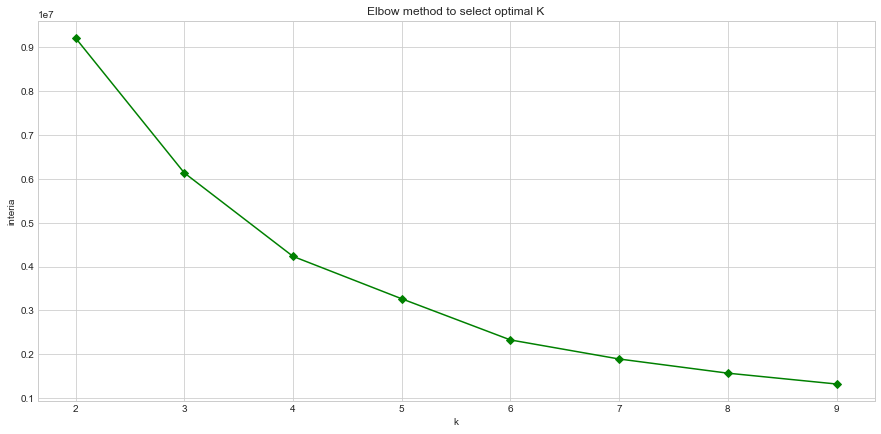

In [32]:
SS = [] 
k_range = range(2, 10)
for i in k_range: 
    kmeans = KMeans(n_clusters=i)
    kmeans.fit_predict(x_cols)
    SS.append(kmeans.inertia_)

plt.figure(figsize=(15,7))
plt.plot(k_range, SS, '-gD')
plt.xlabel('k')
plt.ylabel('interia')
plt.title('Elbow method to select optimal K')

Text(0.5,1,'number of points per cluster')

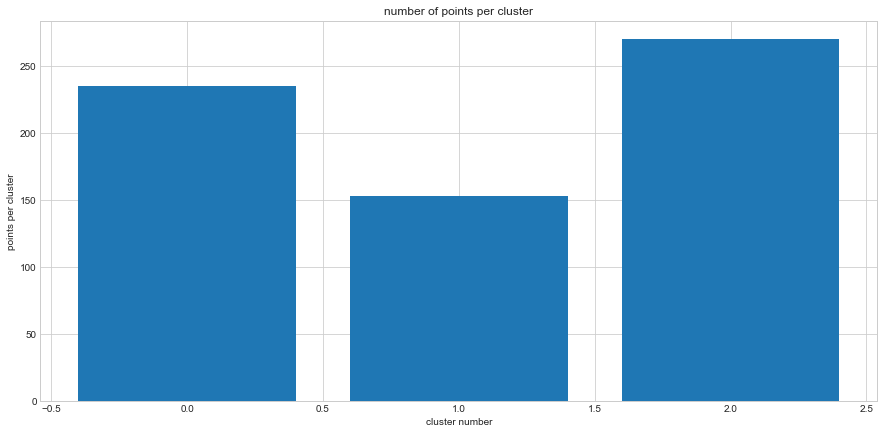

In [33]:
kmeans = KMeans(n_clusters=3)
kmeans.fit(x_cols)
labels = kmeans.predict(x_cols)
cluster_n = range(0,3)

count = np.bincount(labels)
plt.figure(figsize=(15,7))
plt.bar(cluster_n, count)
plt.xlabel('cluster number')
plt.ylabel('points per cluster')
plt.title('number of points per cluster')

### Check clusters using Sillhoutte Method 

For n_clusters = 2 The average silhouette_score is : 0.671968163891
For n_clusters = 3 The average silhouette_score is : 0.476133091177
For n_clusters = 4 The average silhouette_score is : 0.523082650726
For n_clusters = 5 The average silhouette_score is : 0.553044336342
For n_clusters = 6 The average silhouette_score is : 0.52880228171
For n_clusters = 7 The average silhouette_score is : 0.549442544042
For n_clusters = 8 The average silhouette_score is : 0.536533013255


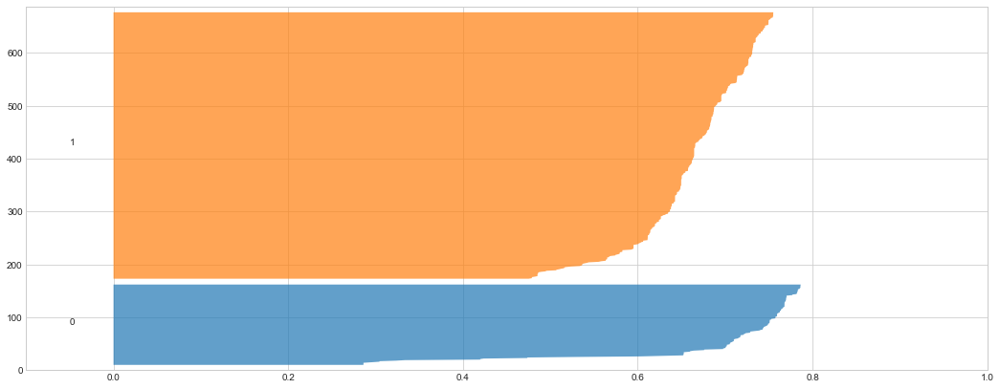

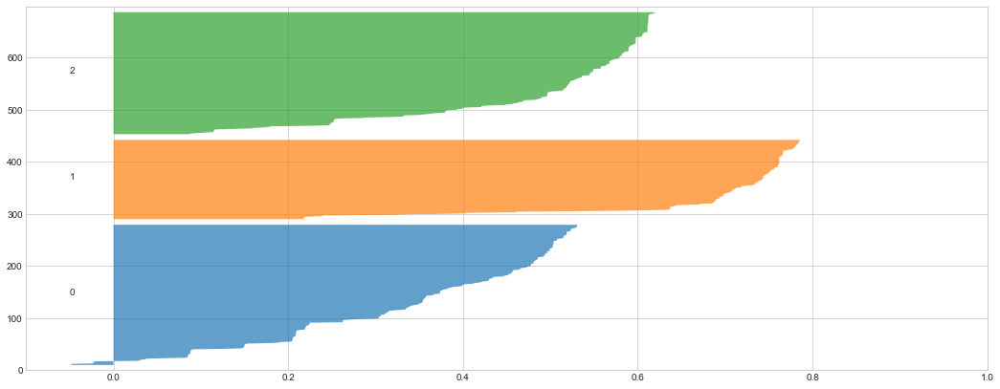

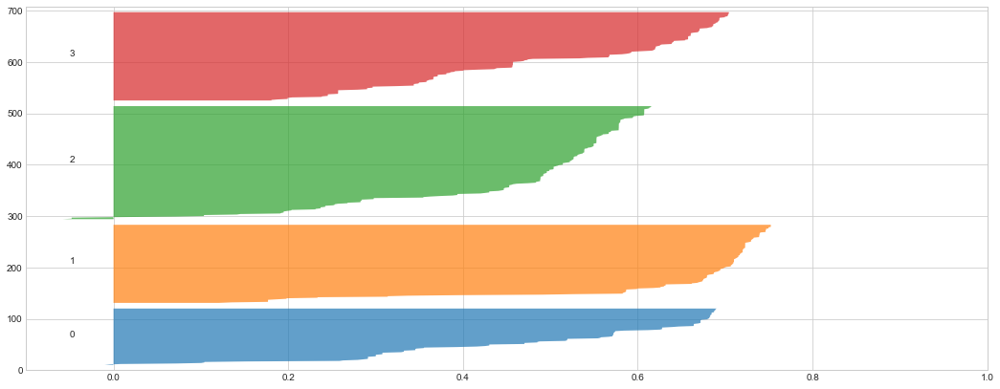

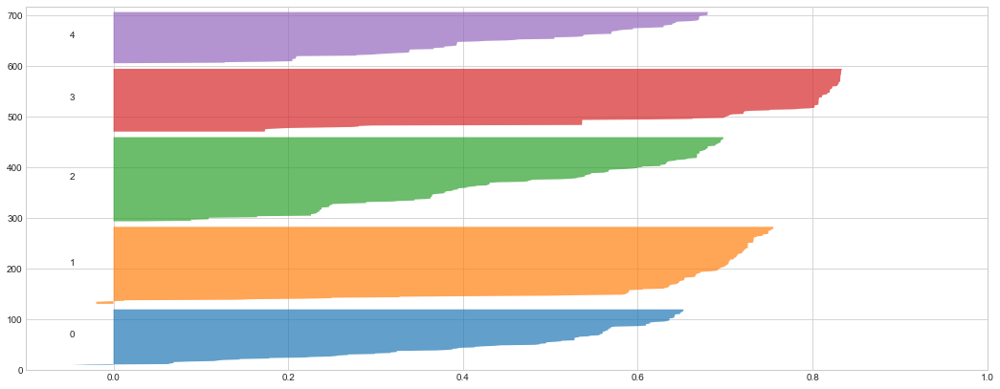

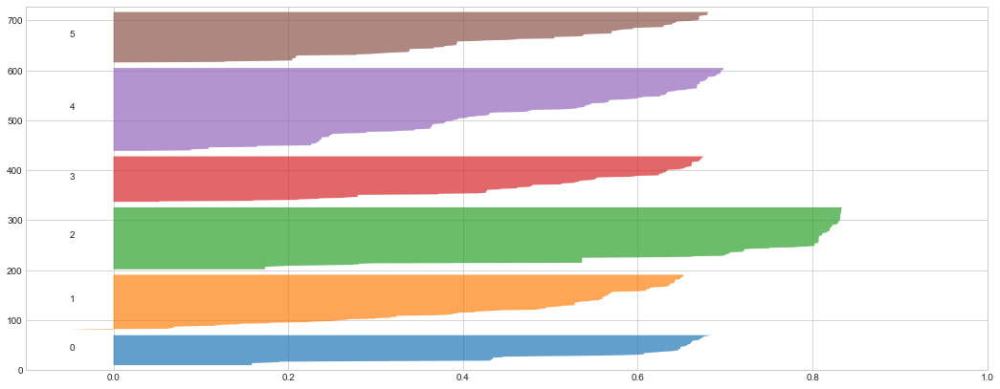

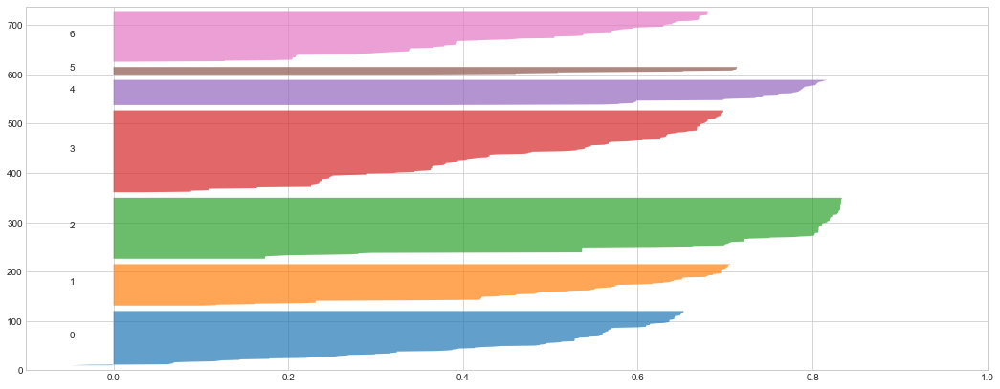

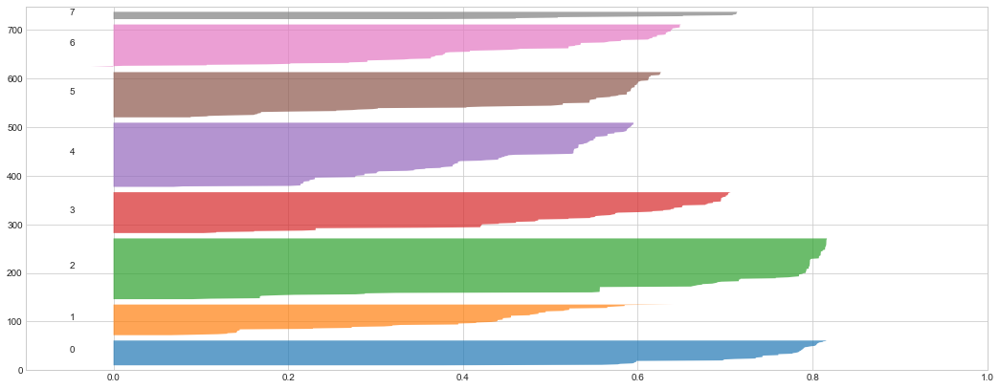

In [34]:
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.datasets import make_blobs
import matplotlib.cm as cm

silhouette_score(x_cols, labels)
cluster_n = [2,3,4,5,6,7,8]

for n_clusters in cluster_n:
    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(x_cols) + (n_clusters + 1) * 10])
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(x_cols)

    silhouette_avg = silhouette_score(x_cols, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
    sample_silhouette_values = silhouette_samples(x_cols, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        #color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

We assume as the optimal number of clusters.

<a id='2'></a>

## Data Exploration 
such as Outlier detection, and Plotting
<br>[Main Menue](#hyperlink)

-  understanding the problem, domain, and data is extremely important for building high performing models


Such as Outlier detection, and Plotting distribution ..etc

#### Example of Data Exploartion 
**A.) Outlier detection or  B.) Distribution of Features**

#### A.) Outlier detection

- An outlier is an observation that deviates drastically from other observations in a dataset
- Occurrence:
    - Natural, e.g. so very high income
    - Error, e.g. human weight of 2,000 lb. due to mistyping extra 0

- Why are they problematic?
    - can skrew your model by affecting the slope (see image below)
    - Error 
        - Indicative of data quality issues
        - Treat in the same way as a missing value, i.e. use imputation


**there are many choices **
   - Many, many approaches for detecting outliers; such as :
    1. - Tukey IQR Outlier detection - Tukey IQR which si Identifies extreme values in data
        a - Outliers are defined as: <br>
               - Values below Q1-1.5(Q3-Q1) or above Q3+1.5(Q3-Q1)
        b - Standard deviation from the mean is another common method to detect extreme values
               - But it can be problematic:
                  - Assumes normality
                  - Sensitive to very extreme values

  2. - Kernel density estimatation: 
      a - Non-parametric way to estimate the probability density function of a given feature


       b- Can be advantageous compared to extreme value detection (e.g. Tukey IQR)
            - Capures outliers in bimodal distributions
            
            
#### B. Distribution of Features

- A histogram is a simple representation of the distribution of values for a given feature


- X-axis represents value bins and y-axis represents the frequency of an observation falling into that bin


- It is also interesting to look at distributions broken up by outcome categories

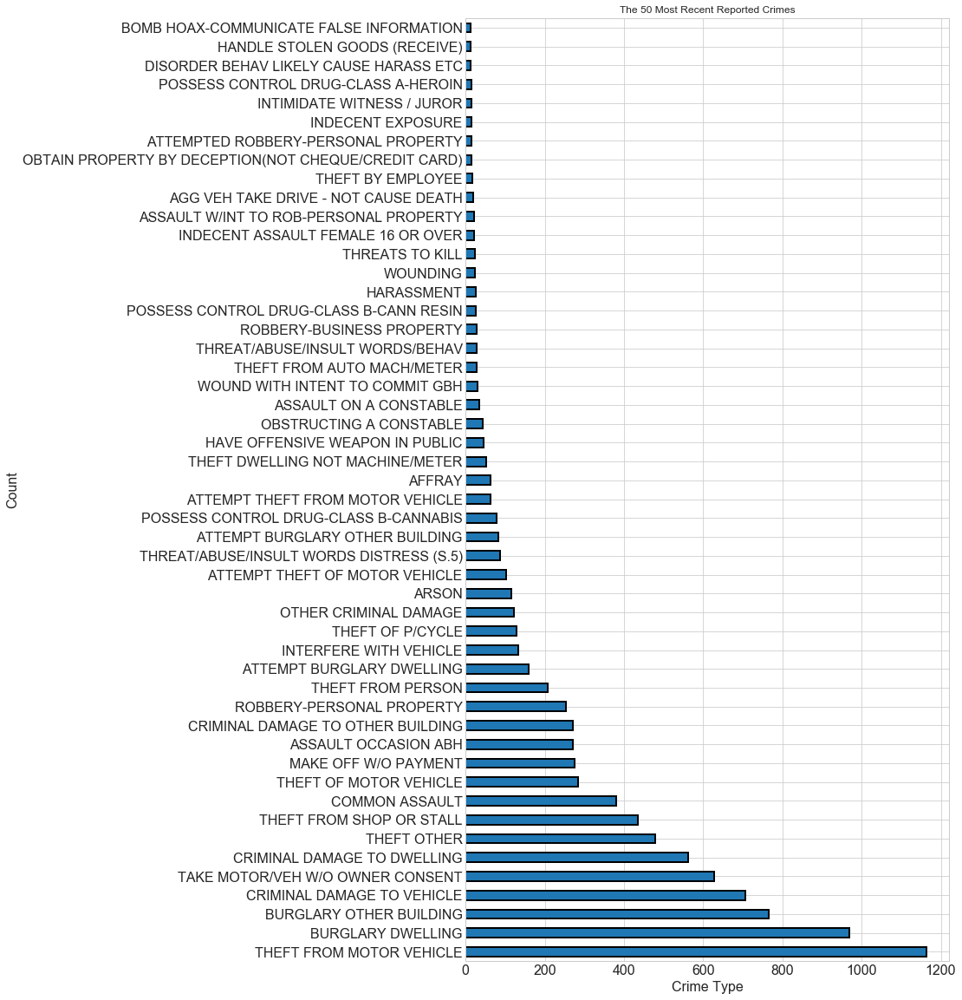

In [35]:
crimeTypes = data['Offence'].value_counts()[:50]
crimeTypes = pd.DataFrame(crimeTypes)
# Now we can visualize the data with a barplot.

plot = crimeTypes.plot(kind='barh', title='The 50 Most Recent Reported Crimes', figsize=(10, 20), legend=False, fontsize=16, edgecolor = 'black', linewidth=2);
plot.set_ylabel('Count', fontsize=16)
plot.set_xlabel('Crime Type', fontsize=16)
plt.show()

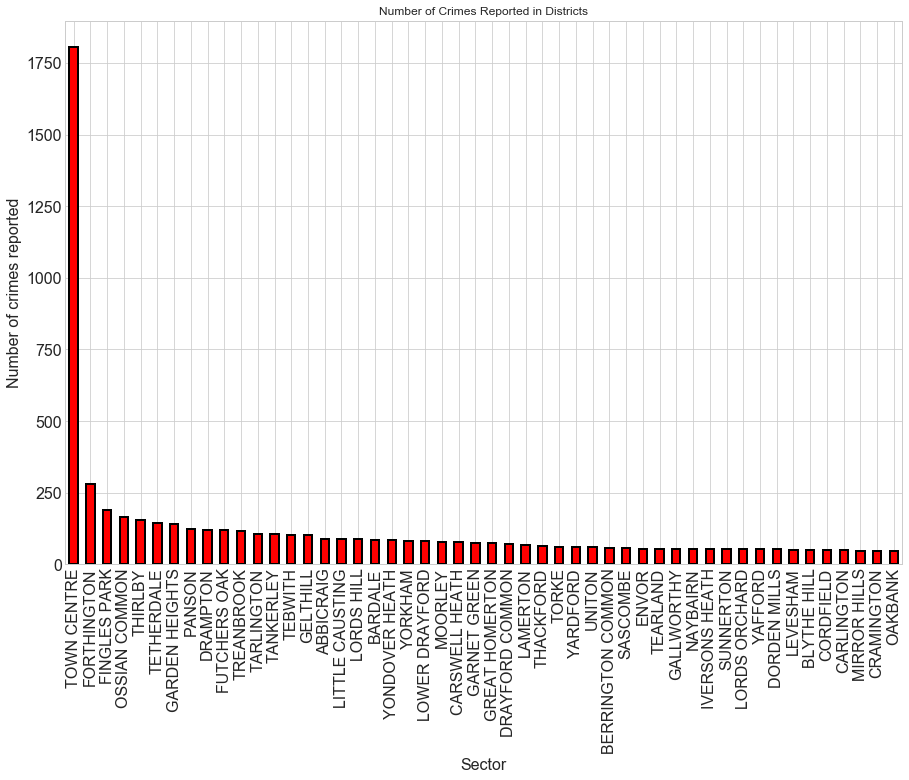

In [36]:
district_sector = data['District'].value_counts()[:50]
                       
district_sector = pd.DataFrame(district_sector)

plot = district_sector.plot(kind='bar', title='Number of Crimes Reported in Districts', figsize=(15, 10), legend=False, fontsize=16, color = 'red', edgecolor = 'black', linewidth=2);
plot.set_ylabel('Number of crimes reported', fontsize=16)
plot.set_xlabel('Sector', fontsize=16)
plt.show()

---

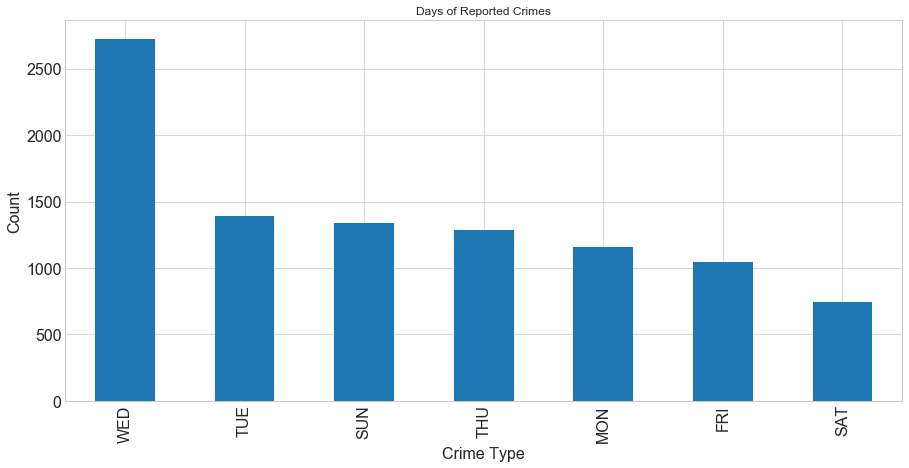

In [37]:
crimeTypes = data['Day_Last_Committed'].value_counts()
crimeTypes = pd.DataFrame(crimeTypes)

plot = crimeTypes.plot(kind='bar', title='Days of Reported Crimes', figsize=(15, 7), legend=False, fontsize=16, linewidth=2);
plot.set_ylabel('Count', fontsize=16)
plot.set_xlabel('Crime Type', fontsize=16)
plt.xticks()
plt.show()

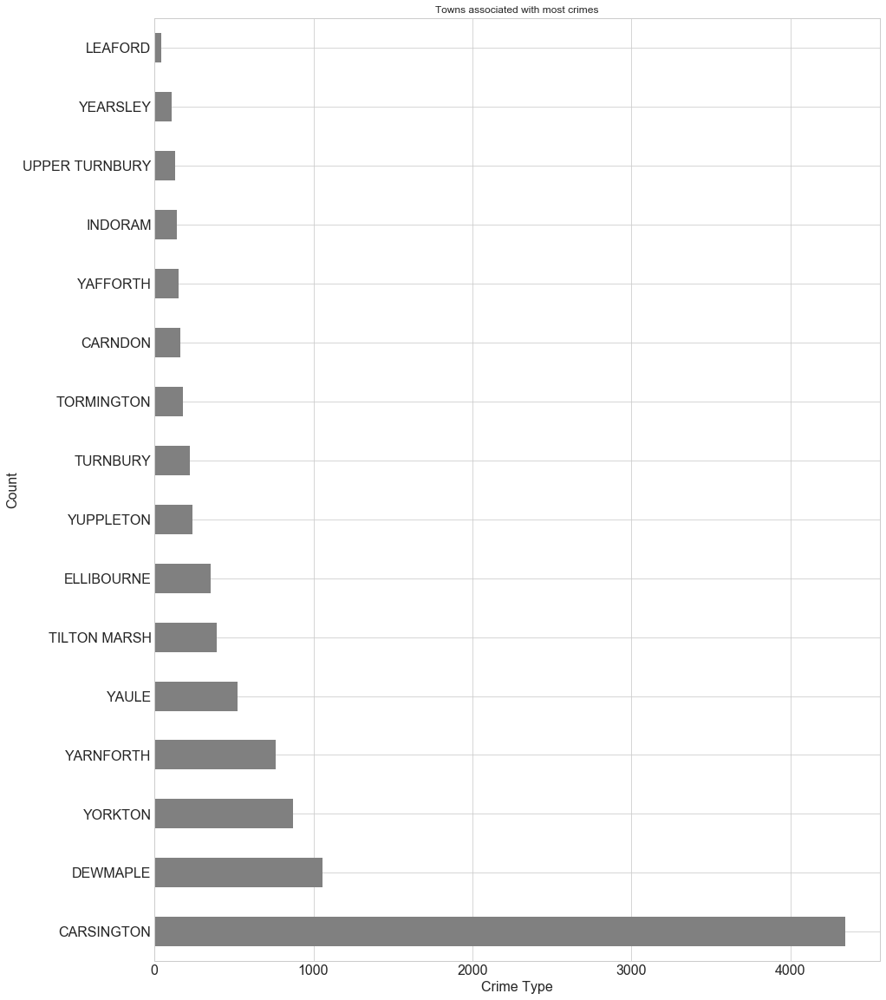

In [38]:
crimeTypes = data['Town'].value_counts()[:50]
crimeTypes = pd.DataFrame(crimeTypes)

plot = crimeTypes.plot(kind='barh', title='Towns associated with most crimes', figsize=(15, 20),color = 'grey', legend=False, fontsize=16, linewidth=2);
plot.set_ylabel('Count', fontsize=16)
plot.set_xlabel('Crime Type', fontsize=16)
plt.xticks()
plt.show()

---

<a id='4'></a>

## Feature Transformation (Feature Engineering)
Scaler, Normalization, Data Reduction , and basically is to To present a reducedrepresentation.
<br>[Main Menue](#hyperlink)

Data Transformation such as (we have not chose yet):
  - Normalisation
  - Attributes Creation ( Feature Construction)
  - Data Reduction ( Feature Extraction )..etc
<br>
 
### Normalisation 
  - I have full [Documents]() to show how to use Normalisation in pytho to Investegate of Dataset , i have use data.police.uk 
 
    ---
  
### Attributes Creation ( Feature Construction)
Attributes Creation called also **Feature Construction** Interaction between or amongst the features
  - Combining Features and A simple two-way interaction is represented by 
       ( X3 = X1 * X2, where X3 is the interaction between X1 and X2 )
       <br>
       
       - Example:
       
          * Interaction: education and political ideology; outcome: concerns about climate change
          * While an increase in education amongst liberals or moderates increases concerns about climate change, an increase in education amongst conservatives has the opposite effect
          * The education-political ideology interaction captures more than the two features alone
   
    ---
    
<a id='5'></a>

### Data Reduction (  Feature Extraction )
To reduce the data (feature transformation ) or choose which features to reduce we need 
<br>[Main Menue](#hyperlink)

(.) First to consider both ways:
   - reduce all features 
   - reduce only related features 

(.) Ferature Reduction for domian-specifc and that Techinque that only applicable in one fields, such as Mapping Data to New Space:  
   - such as FT, WT, PCA, ICA, SVD (Fourier Transformation, Wavelet Transformation, Indepedent CA)= Whcih also Can add interaction terms as additional new features to your model; useful for model if the impact of two or more features on the outcome is non-additive
     
(.) Data Reduction in general have many ways :
   * Data Cube : to reduces number of attributes (may not use it as we need most of the varibales)
   * Numerosity Reduction: such as sampling or clustering BUT (we using Clustering )
   * Dimensionality Reduction : scuh as Encoding ...(availbeb in detials in the Data process doc)
   * **Feature secltion** (in details in the next [section](#6) ) Known also as Attribute Subset Selction (IMPROTANT , we must try ) ..etc
   * Other considered
    
**Note** that the interactions amongst dummy variables belonging to the same categorical feature are always zero. make it some times hard to decide of what we looking forto predict ! <br>
ALso Note that , I have tried in the last few days to use some pre-processign in one of the dataset and used python, also i have documented 
[here]
[here](https://anaconda.org/turkialjrees/dbpreprocessingft/notebook)
 

Python's sklearn machine learning library comes with a PCA implementation. This implementation uses the scipy.linalg implementation of the singular value decomposition. It only works for dense arrays (see numPy dense arrays or sparse array PCA if you are using sparse arrays) and is not scalable to large dimensional data. For large dimensional data we should consider something such as Spark's dimensionality reduction features. In our case we just have 18 variables, and that is far from being a large number of features for any machine learning library and computer nowadays.

When using this implementation of PCA we need to specify in advance the number of principal components we want to use. Then we can just call the fit() method with our data frame and check the results.

---

#### Use the below code for feature selection with new dataset only which has target variable as the column

## Feature Extraction

1. Recursive Feature Elimination
> The Recursive Feature Elimination (or RFE) works by recursively removing attributes and building a model on those attributes that remain.
It uses the model accuracy to identify which attributes (and combination of attributes) contribute the most to predicting the target attribute.


In [39]:
data = df.copy()

In [40]:
data.head()

,HOMC_Code,HOOC_Code,Day_First_Committed_MON,Day_First_Committed_SAT,Day_First_Committed_SUN,Day_First_Committed_THU,Day_First_Committed_TUE,Day_First_Committed_WED,Day_Last_Committed_MON,Day_Last_Committed_SAT,...,Offence_THREAT/ABUSE/INSULT WORDS/BEHAV,Offence_THREATEN TO DAMAGE PROPERTY,Offence_THREATEN WITNESS / JUROR,Offence_THREATS TO KILL,Offence_USE TEST CERTIFICATE W/I TO DECEIVE,Offence_VIOLENT DISORDER,Offence_WOUND WITH INTENT TO COMMIT GBH,Offence_WOUNDING,District_Coded,Beat_Num_Coded
49,45.0,10.0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,263,233
172,45.0,10.0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,242,91
183,58.0,3.0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,240,0
265,45.0,10.0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,675
276,45.0,10.0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,148,582


## Drop highly correlated features

In [41]:
# Create correlation matrix
corr_matrix = data.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find index of feature columns with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.80)]

In [42]:
to_drop

['HOOC_Code', 'Town_DEWMAPLE']

In [43]:
# Drop Marked Features
data.drop(to_drop, axis=1, inplace=True)

### Recursive Feature Elimination - *RFE*

In [ ]:
X = data.drop(['target  variable'], axis=1).fillna(0)
Y = data['target variable'].fillna(0)

In [ ]:
features = X.columns
verb = 2
model = LogisticRegression()

# create the RFE model and select 3 attributes
rfe = RFE(model, 50, verbose=verb)
rfe = rfe.fit(X,Y)

print('RFE Feature Ranking 1: ')
for i, r in enumerate(rfe.ranking_):
    print([r, features[i]])
    
print()

print('Important Features Extracted:')
for i, s in enumerate(rfe.support_):
    if s:
        print(features[i])

### Recursive Feature Elimination Cross-Validated - *RFECV*

In [ ]:
import math
import missingno
from sklearn.feature_selection import RFE, RFECV
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import SelectKBest, chi2, f_classif, mutual_info_classif, f_regression
from sklearn.feature_selection import SelectFromModel
from sklearn.feature_selection import GenericUnivariateSelect, chi2

model = LogisticRegression()
rfe = RFECV(model, cv=4, verbose=verb, step=1)
rfe = rfe.fit(X,Y)

print('Feature Ranking : ')
for i, r in enumerate(rfe.ranking_): print([r, features[i]])
    
print()

print('Features Extracted:')
for i, s in enumerate(rfe.support_):
    if s: print(features[i])

### SelectKBest

In [ ]:
# mutual_info_regression(X, y) -> Estimate mutual information for a continuous target variable.
selectors = []
# list of statistical functions
functions = [    
    f_classif, 
    mutual_info_classif,
    f_regression
]

for f in functions:
    sel = SelectKBest(f, k=2)
    sel.fit(X, Y)
    selectors.append(sel)
    
pd.DataFrame(X).head()

In [ ]:
for sel in selectors:
    print('Score of: ', sel.score_func.__name__)
    print(sel.scores_, end='\n\n')

### SelectPercentile

In [ ]:
from sklearn.feature_selection import SelectPercentile

selectors = []
functions = [
    f_classif, 
    mutual_info_classif,
    f_regression
]
for f in functions:
    sel = SelectPercentile(f, percentile=80)
    sel.fit(X, Y)
    selectors.append(sel)
    
pd.DataFrame(X).shape

In [ ]:
for sel in selectors:
    print('Score of: ', sel.score_func.__name__)
    print(sel.transform(X).shape)
    print(sel.scores_, end='\n\n')

### SelectFromModel

In [ ]:
model = LogisticRegression()

sel = SelectFromModel(model).fit(X, Y)
n_features = sel.transform(X).shape[1]
X_transform_SFM = sel.transform(X)
X_transform_SFM.shape

## Principal Component Analysis

> Principal Component Analysis (or PCA) uses linear algebra to transform the dataset into a compressed form.

> Generally this is called a data reduction technique. A property of PCA is that you can choose the number of dimensions or principal component in the transformed result.

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=50)
fit = pca.fit(X)
plt.figure(figsize=(15,7))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

---

### Feature Importance
Bagged decision trees like Random Forest and Extra Trees can be used to estimate the importance of features.

In [ ]:
model = RandomForestClassifier()
model.fit(X, Y)
print(model.feature_importances_)

## Feature Selection

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
clf = ExtraTreesClassifier(n_estimators=200)
clf = clf.fit(X, Y)

In [ ]:
features = pd.DataFrame()
features['feature'] = X.columns
features['importance'] = clf.feature_importances_

In [ ]:
features = features.sort_values(['importance'],ascending=False).reset_index(drop=True)
features

In [ ]:
plt.figure(figsize=(15,7))
plt.bar(features.feature.tolist()[:10], features.importance.tolist()[:10])
plt.xticks(rotation = 90)
plt.show()

### Use the above code for feature selection with new dataset only which has target variable as the column

# Using PCA

In [45]:
from sklearn.decomposition import PCA

pca = PCA(n_components=40)
pca.fit(x_cols)

PCA(copy=True, iterated_power='auto', n_components=40, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

[  8.48765289e-01   1.51087317e-01   1.16959227e-04   6.20244503e-06
   6.06383928e-06   5.31427229e-06   3.65288801e-06   2.09620220e-06
   1.84635502e-06   1.75083497e-06   1.17686582e-06   9.02385470e-07
   6.13676886e-07   5.20726275e-07   2.20043707e-07   7.47895589e-08
   8.47409030e-33   8.47409030e-33   8.47409030e-33   8.47409030e-33
   8.47409030e-33   8.47409030e-33   8.47409030e-33   8.47409030e-33
   8.47409030e-33   8.47409030e-33   8.47409030e-33   8.47409030e-33
   8.47409030e-33   8.47409030e-33   8.47409030e-33   8.47409030e-33
   8.47409030e-33   8.47409030e-33   8.47409030e-33   8.47409030e-33
   8.47409030e-33   8.47409030e-33   8.47409030e-33   8.47409030e-33]


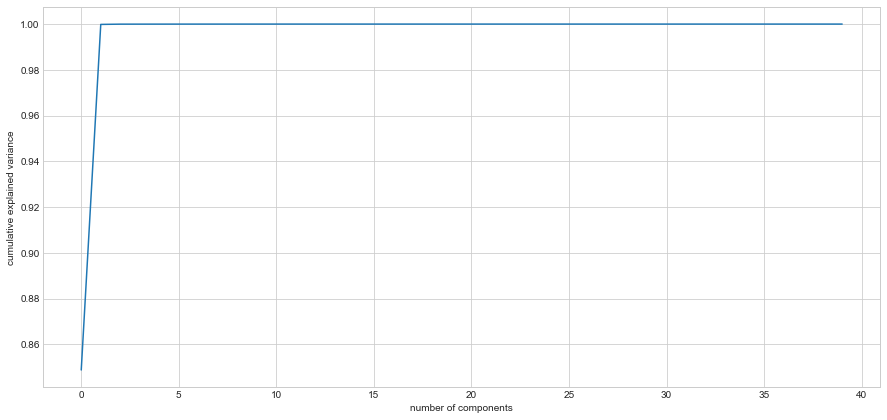

In [46]:
print(pca.explained_variance_ratio_) 
plt.figure(figsize=(15,7))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [47]:
# This gives us an object we can use to transform our data by calling transform.
pca_d = pca.transform(x_cols)

Or we could have just called fit_transform to perform both steps in one single call.

In both cases we will end up with a lower dimension representation of our data frame, as a numPy array. Let's put it in a new dataframe.

<a id='6'></a>

## Feature Selction  and model building:
also known as Feature Construction, Creations, or Combining Features, and it is to Interactions between features
<br>[Main Menue](#hyperlink)

#### Build model using processed data

I have not yet decided which feature to select (i should not ) because i would like to consider all data set values and features to be reduce then we can compare , at the end the key is if we do not use the right features our module will make bad prediction, we need only the features that are relevant to our problem (it could be all features)

**here an example i saw in tutorial in [youtube](https://www.youtube.com/watch?v=0xVqLJe9_CY&feature=youtu.be)**

> e.g. choosing feature :
 in python , we need to identfy or to crate 2 array (to hold our class labels and features) , then 
	we can iterate over the data using the loop, and spilt the lable from the features 
	... Then convert that lables to integers. 
		this can be done by define the row as an array of values 
		by splitting the lines by the comma seprator, then by using this rows we can get the associate
		class lable by retrieving the first in a rwo arrays then converting it to an int then adding to 
		our labeles array. now we can do the same thing for our features array so will take each feature and convert it to 
		float of arrays , since we wanted precision in our values .
	At the end of this procedure : our features array is now an array of array (becuse we have 
	define the row as an arrays and convert it to a float of arrays)
    !!! You can watch the video then you will get the idea !!


<a id='8'></a>

# Applying advanced subspace Clustering
 
 such as spectral Clustering  

Text(0.5,1,'Elbow method to select optimal K')

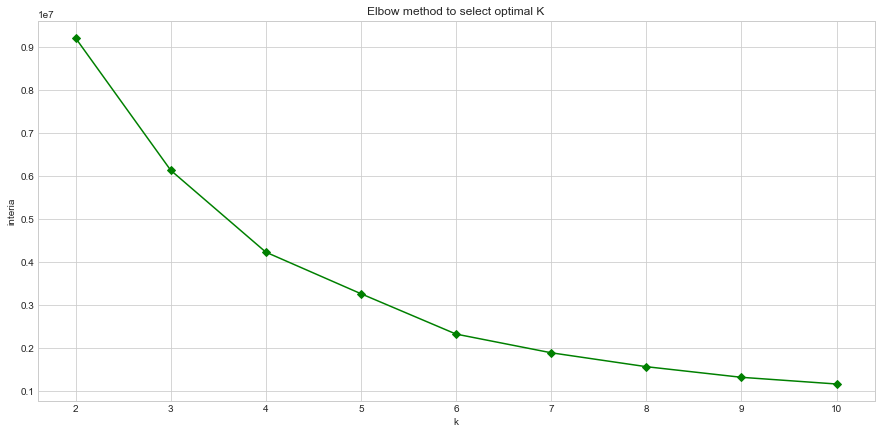

In [48]:
SS = [] 
k_range = range(2, 11)
for i in k_range: 
    kmeans = KMeans(n_clusters=i)
    kmeans.fit_predict(pca_d)
    SS.append(kmeans.inertia_)

plt.figure(figsize=(15,7))
plt.plot(k_range, SS, '-gD')
plt.xlabel('k')
plt.ylabel('interia')
plt.title('Elbow method to select optimal K')

3 number of clusters are confirmed, as also after PCA and feature extraction, we get the similar elbow plot.

### Use the below code for feature selection with new dataset only which has target variable as the column

In [49]:
from sklearn import cluster
k_clusters = 3
results = []
algorithms = {}

# K-Means Clustering
algorithms['kmeans'] = cluster.KMeans(n_clusters=k_clusters, n_init=200)
# Agglomerative Clustering
algorithms['agglom'] = cluster.AgglomerativeClustering(n_clusters=k_clusters, linkage="ward")
# Spectral Clustering
algorithms['spectral'] = cluster.SpectralClustering(n_clusters=k_clusters)
# Affinity Propagation
algorithms['affinity'] = cluster.AffinityPropagation(damping=0.6)

In [50]:
# Fit all models
for model in algorithms.values():
    model.fit(pca_d)
    results.append(list(model.labels_))

C:\Users\SHIVAM\Anaconda3\lib\site-packages\sklearn\manifold\spectral_embedding_.py:234: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


In [52]:
print(results)

[[0, 0, 0, 1, 1, 2, 2, 0, 2, 2, 1, 2, 0, 0, 1, 2, 2, 0, 1, 0, 2, 0, 2, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 2, 2, 2, 0, 2, 2, 0, 1, 1, 2, 0, 2, 0, 2, 0, 2, 0, 2, 1, 0, 0, 2, 2, 2, 0, 1, 0, 2, 2, 0, 0, 1, 1, 2, 0, 1, 2, 2, 0, 0, 2, 2, 2, 2, 1, 2, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 1, 2, 0, 0, 2, 0, 0, 0, 1, 2, 2, 1, 0, 0, 0, 2, 2, 2, 1, 0, 1, 0, 0, 2, 1, 1, 2, 2, 0, 2, 0, 1, 2, 2, 2, 0, 2, 2, 0, 2, 0, 2, 0, 1, 2, 2, 0, 0, 1, 0, 2, 2, 0, 1, 2, 0, 2, 0, 1, 0, 0, 0, 0, 0, 0, 2, 1, 2, 1, 2, 1, 0, 1, 2, 0, 2, 0, 2, 1, 0, 1, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 1, 2, 0, 2, 2, 2, 1, 2, 2, 0, 1, 0, 0, 0, 2, 2, 2, 1, 2, 2, 1, 1, 1, 0, 0, 0, 1, 1, 2, 2, 2, 1, 2, 2, 0, 1, 2, 1, 0, 0, 2, 0, 0, 2, 0, 1, 2, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 2, 1, 2, 1, 1, 0, 2, 1, 1, 2, 2, 0, 2, 1, 1, 0, 2, 0, 0, 2, 2, 0, 2, 0, 2, 0, 2, 1, 1, 0, 0, 1, 0, 0, 0, 1, 2, 0, 1, 0, 2, 2, 2, 1, 2, 2, 1, 0, 1, 0, 0, 2, 2, 1, 1, 0, 0, 1, 2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 2, 2, 2, 1,

In [54]:
algorithms

{'kmeans': KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
     n_clusters=3, n_init=200, n_jobs=1, precompute_distances='auto',
     random_state=None, tol=0.0001, verbose=0),
 'agglom': AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
             connectivity=None, linkage='ward', memory=None, n_clusters=3,
             pooling_func=<function mean at 0x0000019120F7C620>),
 'spectral': SpectralClustering(affinity='rbf', assign_labels='kmeans', coef0=1, degree=3,
           eigen_solver=None, eigen_tol=0.0, gamma=1.0, kernel_params=None,
           n_clusters=3, n_init=10, n_jobs=1, n_neighbors=10,
           random_state=None),
 'affinity': AffinityPropagation(affinity='euclidean', convergence_iter=15, copy=True,
           damping=0.6, max_iter=200, preference=None, verbose=False)}

#### METRICS & PLOTTING

1. Normalized Mutual Information (NMI)
Mutual Information of two random variables is a measure of the mutual dependence between the two variables. 
Normalized Mutual Information is a normalization of the Mutual Information (MI) score to scale the results between 0 (no mutual information) and 1 (perfect correlation). 
In other words, 0 means dissimilar and 1 means a perfect match.

2. Adjusted Rand Score (ARS)
Adjusted Rand Score on the other hand, computes a similarity measure between two clusters. 
ARS considers all pairs of samples and counts pairs that are assigned in the same or different clusters in the predicted and true clusters.


In [ ]:
# If y_true is thr true label, that we have
nmi_results = []
ars_results = []

y_true_val = list(y_true.values())

# Append the results into lists
for y_pred in results:
    nmi_results.append(normalized_mutual_info_score(y_true_val, y_pred))
    ars_results.append(adjusted_rand_score(y_true_val, y_pred))
    
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(16, 5))
x = np.arange(len(y))
avg = [sum(x) / 2 for x in zip(nmi_results, ars_results)]

xlabels = list(algorithms.keys())

sns.barplot(x, nmi_results, palette='Blues', ax=ax1)
sns.barplot(x, ars_results, palette='Reds', ax=ax2)
sns.barplot(x, avg, palette='Greens', ax=ax3)

ax1.set_ylabel('NMI Score')
ax2.set_ylabel('ARS Score')
ax3.set_ylabel('Average Score')

# # Add the xlabels to the chart
ax1.set_xticklabels(xlabels)
ax2.set_xticklabels(xlabels)
ax3.set_xticklabels(xlabels)

# Add the actual value on top of each bar
for i, v in enumerate(zip(nmi_results, ars_results, avg)):
    ax1.text(i - 0.1, v[0] + 0.01, str(round(v[0], 2)))
    ax2.text(i - 0.1, v[1] + 0.01, str(round(v[1], 2)))
    ax3.text(i - 0.1, v[2] + 0.01, str(round(v[2], 2)))

# Show the final plot
plt.show()

---

In [ ]:
from sklearn.cluster import AffinityPropagation, SpectralClustering, AgglomerativeClustering, DBSCAN
from itertools import cycle

# Create object and fit data
spectral = SpectralClustering(n_clusters = 4).fit(pca_d)
# Print location of clusters learned by kmeans object
print(kmeans.cluster_centers_)
# Save new clusters for chart
y_km = kmeans.fit_predict(pca_d)

#### <br>[Main Menue](#hyperlink)

### Thank you for reading this cahpter 

Please visit my webpage for more articles on ML for Big Data 

<a href="https://turkialjrees.com">www.turkialjrees.com</a>


---

   [Return to Top of the page ](#section0) --->